# Using U.S. Permanent Residents Data to Explain Housing Prices

## by Yucheng Liu
A common claim made by many is that immigration pushes up housing prices. Moreover, sometimes these claims are targeted to immigrants with a specific origin. An example is that Chinese immigrants causes housing prices to rise. 

In this project, I use annual country-specific Lawful Permanent Residents (PR) data to the United States and housing data to find evidence for/against these claims. I target to answer 2 questions:

1. Do newly admitted Permanent Residents push up housing prices?
2. Specifically, do Chinese immigrants affect housing prices differently than an average immigrant?

I use linear regression models to estimate correlations between appropriate variables. My findings are:

1. Immigration is positively correlated with housing prices. 
2. Chinese immigrants does not affect prices differently than an average immigrant. 

As a bonus thing that I got from the data, I estimated correlations of PR admission with prior years of housing prices. Interstingly, PR admission is positively correlated with housing prices 6 years ago and negatively correlated with housing prices 7 years ago. 

### References
1.	Zillow Home Value Index (ZHVI), 1996-2020  https://www.zillow.com/research/data/
2.	U.S. Lawful Permanent Residents data, 2004-2018 https://www.dhs.gov/immigration-statistics/lawful-permanent-residents

## Data Cleaning
### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import qeds
import geopandas as gpd
from pathlib import Path
folder = Path(r"C:\Users\YuchengLiu\Documents\323")
pd.__version__

'1.0.3'

In [2]:
import json
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, output_file
from bokeh.models import GeoJSONDataSource, LinearColorMapper, LogColorMapper
from bokeh.models import ColorBar, HoverTool, LogTicker
from bokeh.palettes import brewer
output_notebook()

Loading BokehJS ...

In [3]:
import seaborn as sns
import sklearn
from sklearn import linear_model
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant

### Import and Clean Data
The housing data is monthly. I turned it to yearly data by averaging. 

In [4]:
years = range(2004,2019)

# import housing file
housing_file = folder / 'housing_by_metro.csv'
housing = pd.read_csv(housing_file)
metro_housing = housing['RegionName']
housing=housing.set_index('RegionName').drop(columns=['RegionID','SizeRank'])

# take year average
housing.columns=pd.to_datetime(housing.columns)
housing=housing.T.reset_index().groupby(pd.Grouper(key='index',freq='Y')).mean().T
housing.columns.name = 'year'

log_housing = housing.apply(np.log)
#housing.head()

In [5]:
def get_metro_map(dfa,metro_housing):
    '''search the housing file to match metro names'''
    metro_pr = dfa.index
    d = {}
    for metro in metro_pr:
        if metro == 'Total':
            d[metro]='United States'
            continue
        if (metro_housing==metro).sum() != 0:
            #print(metro)
            #print((metro_housing==metro).sum())
            d[metro]=metro
        else:
            x = set()
            end = metro.find(',')
            cities = metro[:end].split('-')
            states = metro[end+1:].strip().split('-')
            #print(cities)
            #print(states)
            #print()
            for city in cities:
                for state in states:
                    if city != '':
                        #print(city)
                        a = metro_housing.str.contains(city)
                        b = metro_housing.str.contains(state)
                        s = a&b
                        values = metro_housing[s[s].index].values
                        #print(values)
                        x = x.union(metro_housing[s[s].index].values)
            if x:
                #print(len(x), end=' ')
                #if len(x)!=1:
                    #print(metro, x)
                d[metro] = x.pop() # empirically, unique 
    d['Louisville/Jefferson County, KY-IN']='Louisville-Jefferson County, KY'
    return d

In [6]:
def load_code_file():
    df = pd.read_csv(folder / 'cbsa_to_county.csv')
    df = df[['cbsacode','cbsatitle']][1:].drop_duplicates()
    df['cbsacode']=df['cbsacode'].astype(int)
    df = df.set_index('cbsatitle')
    mapping = get_metro_map(df,metro_housing)
    df.index = df.index.map(mapping)
    return df
code_df=load_code_file()
#code_df

The PR data has a file for each year. I cleaned them individually and append them together. 

In [7]:
# import PR file
def get_year(year, matched_names, common_names, country_level=False):
    '''load and process PR file for a single year'''
    pr_folder_name = folder / 'pr_tables'
    for file in pr_folder_name.iterdir():
            #print(file.name)
            if(file.name.startswith(str(year))):
                break
                
    # extract the data
    header = 3 if year > 2012 else 4
    df = pd.read_excel(file, header=header)
    dfa= df.loc[10:] if country_level else df.loc[1:8]

    # remove footnotes
    dfa=dfa.set_index('Region and country of birth')
    last=dfa.index.get_loc('Unknown')
    dfa=dfa[:last].T
    
    # match metro names with housing data
    mapping = get_metro_map(dfa,metro_housing)
    matched_names = matched_names.union(mapping.values())
    common_names  = common_names.intersection(mapping.values())
    dfa.index = dfa.index.map(mapping)
    dfa=dfa[dfa.index.notnull()]
    dfa=dfa.replace({'D':0,'-':0}).astype(float)
    
    # merge with cbsa code
    dfa = (dfa.reset_index()
               .merge(code_df.reset_index(),left_on='index',right_on='cbsatitle',how='left')
               .set_index('index')
               .drop('cbsatitle',axis=1))
    dfa.loc['United States','cbsacode']=0 # put 0 for U.S.
    # add year
    dfa['year']=pd.to_datetime(f"{year}-12-31")
    # fix some names
    dfa=dfa.rename(columns={'Korea':'Korea, South', 'Antigua-Barbuda':'Antigua and Barbuda'})
    return dfa, matched_names, common_names

# append all the years together
pr = pd.DataFrame()
matched_names = set()
common_names  = set(metro_housing)
for year in range(2004,2019):
    print('-',end='')
    dta, matched_names, common_names = get_year(year, matched_names, common_names, True)
    pr = pr.append(dta)
pr = pr.dropna(axis=1)
print('Done loading PR files!')

---------------Done loading PR files!


These states and cbsa's dataframs are for mapping. 

In [8]:
def load_state_df():
    df = gpd.read_file('https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_5m.zip')
    df['cbsacode'] = 0.0
    df.set_index('STATEFP')
    return df[['NAME','cbsacode','geometry']]

state_df=load_state_df()
#state_df

In [9]:
def load_cbsa_df():
    df = gpd.read_file("https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_cbsa_5m.zip")
    df['cbsacode'] = df['CBSAFP'].astype(float)
    return df[['cbsacode','geometry']]
cbsa_df=load_cbsa_df()
#cbsa_df

## Visualizing the PR data

First, I give a visualization of the Permanent Residence data. 

In [10]:
def graph_pr_bokeh(df1,df2, year, paint_according_to='Total'):
    #paint_according_to='Japan'
    geojson1=GeoJSONDataSource(geojson=df1.to_json())
    geojson2=GeoJSONDataSource(geojson=df2.to_json())
    if paint_according_to in {'Total','China','Mexico','Russia'}:
        color_mapper = LogColorMapper(palette = brewer['YlOrRd'][9][::-1])
    else:
        color_mapper = LinearColorMapper(palette = brewer['YlOrRd'][9][::-1])
    color_bar = ColorBar(color_mapper=color_mapper, ticker=LogTicker(),
                         label_standoff=12, height = 20,
                         border_line_color=None, location = (0,0), orientation = 'horizontal')
    title=f"Persons Obtaining PR Status by Region and Country of Birth in {year}"
    if paint_according_to != 'Total':
        title += f', colored by persons from {paint_according_to}'
    p = figure(title=title, plot_width=750, plot_height=500, tools="pan,box_zoom,reset,previewsave")
    hover_off=p.patches("xs","ys",source=geojson1, fill_color='white', line_color='grey')
    hover_on =p.patches("xs","ys",source=geojson2, line_color='black',
                       fill_color = {'field' :paint_according_to, 'transform' : color_mapper})
    tooltips = [('Region','@index'), ('Total' ,'@Total'), ('Canada','@Canada'), 
                ('China' ,'@China'), ('Mexico','@Mexico'),]
    temp = (paint_according_to, '@'+paint_according_to)
    if temp not in tooltips:
        tooltips.append(temp)
    hover = HoverTool(tooltips = tooltips, renderers=[hover_on])
    p.add_tools(hover)
    #p.add_layout(color_bar, 'below')
    show(p)
    
def graph_pr(year=2018, paint_according_to='Total', bokeh=True):
    year2 = f"{year}-12-31"
    data = (pr[pr['year']==year2]
            .drop(index=['Urban Honolulu, HI'])
            .reset_index()
            .drop(columns='year')
            .rename(columns={"China, People's Republic":'China'}))
    # First draw US, then draw the metros
    '''{
     27:Hawaii, 
     39:US Virgin Islands, 
     47:Guam,
     48:Commonwealth of the Northern Mariana Islands,
     49:American Samoa, 
     51:Puerto Rico, 
     55:Alaska}'''
    df1 = state_df.drop(index=[27,39,47,48,49,51,55]).merge(data, on='cbsacode', how='left')
    df2 = cbsa_df.merge(data,on='cbsacode', how='inner')
    if bokeh:
        graph_pr_bokeh(df1, df2, year, paint_according_to)
    else:
        fig, gax = plt.subplots(figsize=(15, 10))
        df1.plot(ax=gax, alpha=0.3)
        df2.plot(ax=gax, edgecolor="black", color="white")
    #return df1,df2
graph_pr(2018)
graph_pr(2018, 'China')

See Appendex 1 for maps colored with other countries. 

Next, I present how PR admissions change over time.

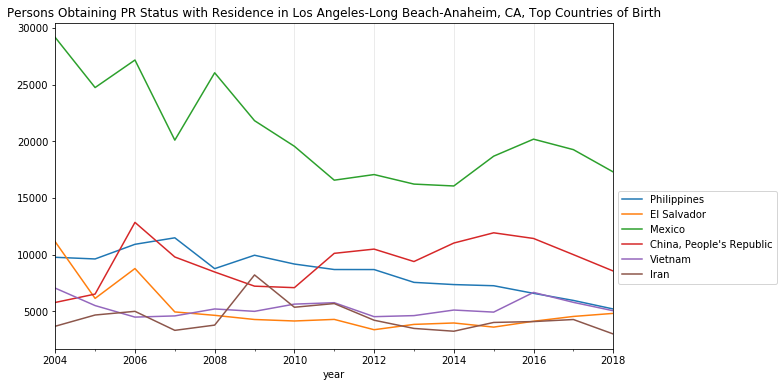

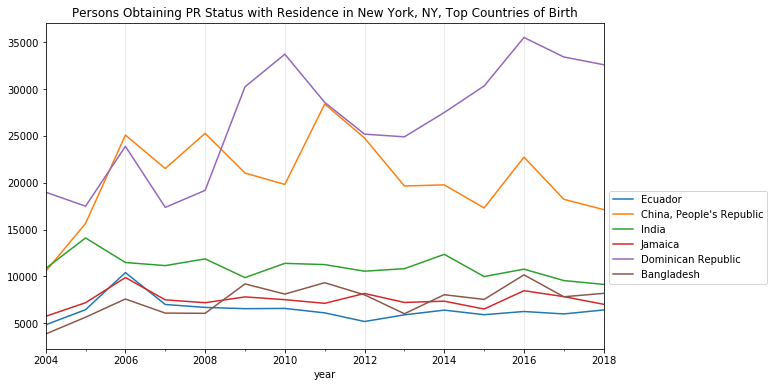

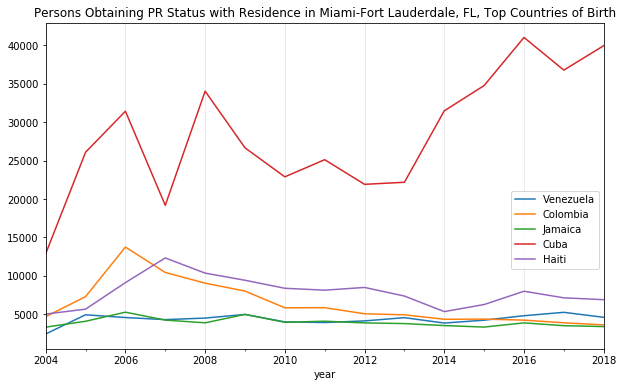

In [11]:
# plot the PR data over time, find the top 4 countries
def plot_pr_over_time(region='United States', n=4, percent=False, keep_total=False):
    '''plots the percentage of immigrants over time for top n countries in all years, 
        so there might be more than n countries plotted, default n=4'''
    def top_regions(data, num=5):
        return set.union(*list(data.agg(lambda r:set(r.nlargest(num).index),axis=1)))
    
    data = pr.loc[region].drop(columns=['cbsacode']).set_index('year')
    regions = top_regions(data, n+1)
    #print(regions, len(regions), sep='\n')
    data = data[regions]
    relative = data.div(data['Total'], axis=0)
    if not keep_total:
        data = data.drop(columns='Total')
        relative = relative.drop(columns='Total')
    
    fig, ax = plt.subplots(1, 1, figsize=(10,6))
    title = f'Persons Obtaining PR Status with Residence in {region}, Top Countries of Birth'
    if percent:
        relative.plot(ax=ax, title=title)
        ax.yaxis.set_major_formatter(PercentFormatter(1))
    else:
        data.plot(ax=ax, title=title)
    ax.legend(bbox_to_anchor=(1, 0.5))
    ax.xaxis.grid(True, alpha=0.3)
    
plot_pr_over_time('Los Angeles-Long Beach-Anaheim, CA',3)
#plot_pr_over_time('San Francisco, CA')
#plot_pr_over_time('Seattle, WA')
#plot_pr_over_time('Washington, DC')
plot_pr_over_time('New York, NY')
#plot_pr_over_time('Chicago, IL')
plot_pr_over_time('Miami-Fort Lauderdale, FL')
#plot_pr_over_time()

The distribution of PR admissions is very different across metropolitans. 

## Visualizing the housing data

In [12]:
# reduce housing dataframe
housing = housing.loc[matched_names]
log_housing = log_housing.loc[matched_names]

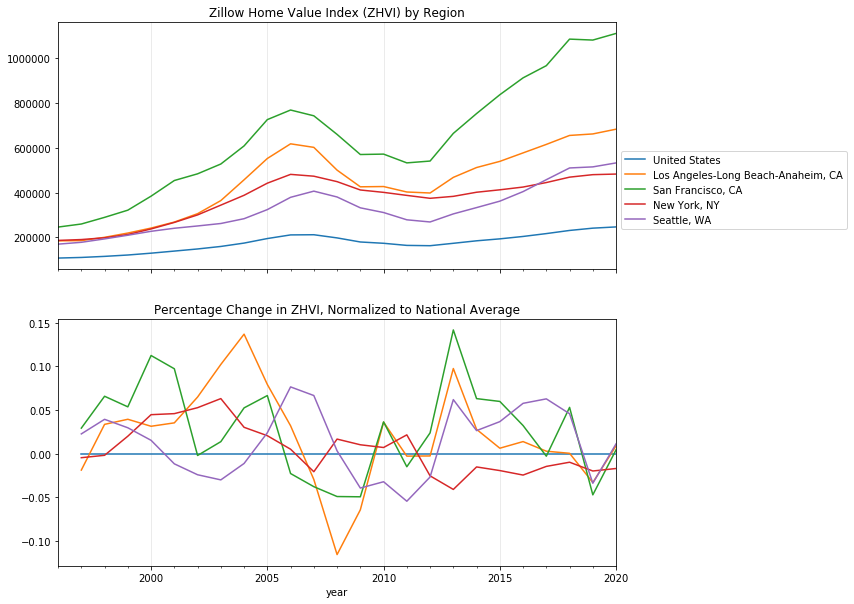

In [13]:
# plotting housing
def plot_housing(regions=None):
    if regions==None:
        regions = ['United States','Los Angeles-Long Beach-Anaheim, CA',
          'San Francisco, CA', 'New York, NY','Seattle, WA']
    if 'United States' not in regions:
        regions.append('United States')
    log_housing_change = log_housing.T - log_housing.T.shift(1)
    rel_log_housing_change = log_housing_change.subtract(log_housing_change['United States'],axis=0)
    fig, ax = plt.subplots(2,1,figsize=(10,10))
    
    housing.T[regions].plot(ax=ax[0], title='Zillow Home Value Index (ZHVI) by Region')
    rel_log_housing_change[regions].plot(ax=ax[1],sharex = ax[0], 
                        title='Percentage Change in ZHVI, Normalized to National Average')
    #ax[0].get_legend().remove()
    ax[1].get_legend().remove()
    ax[0].xaxis.grid(True, alpha=0.3)
    ax[1].xaxis.grid(True, alpha=0.3)
    ax[0].legend(bbox_to_anchor=(1, 0.5)) 
plot_housing()

You can see different US metropolitans have different housing price trajectories. I try to explain these differences by PR admissions. 

## Do newly admitted Permanent Residents push up housing prices?

Let's now analyze the first question. Intuitively, more immigration admission leads to more demand of housing, which pushes up housing prices. What does the data say?

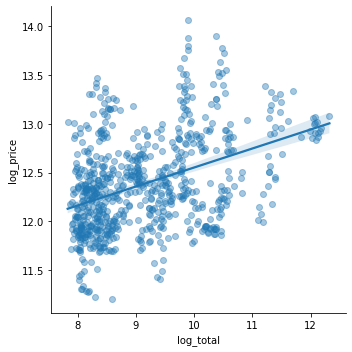

In [14]:
# Merging the datasets
log_housing2 = log_housing.stack().reset_index().rename(columns={0:'log_price'})
df = pr.reset_index().merge(log_housing2, left_on=['index','year'],
            right_on=['RegionName','year']).set_index('RegionName').drop(columns=['index'])
df['log_total']=df['Total'].apply(np.log)
df2=df.drop(index='United States')

# first plot
sns.lmplot(data=df2, x='log_total',y='log_price',scatter_kws=dict(alpha=0.4))

The fitted line is upward slopping, indicating a positive correlation between log total immigration and log housing prices. 

We can check the coefficient:

In [15]:
lr_model = linear_model.LinearRegression()
lr_model.fit(df2[['log_total']], df2['log_price'])

beta_0 = lr_model.intercept_
beta_1 = lr_model.coef_[0]

print(f"Fitted model: log(price) = {beta_0:.3f} + {beta_1:.3f} log(Total)")

Fitted model: log(price) = 10.606 + 0.195 log(Total)


This naive linear regression predicts every percent increase in PR admission is correlated with 19.5% increase in housing prices. 

## Do Chinese immigrants push up housing prices more?

To investigate the second question, I use a more complicated linear regression models to estimate the correlation between number of Chinese immigrants and log housing prices. I do this by creating a dummy variable for being born in China. I still keep the overall immigration admission variable log_total; I also have region and year dummies as controls. 

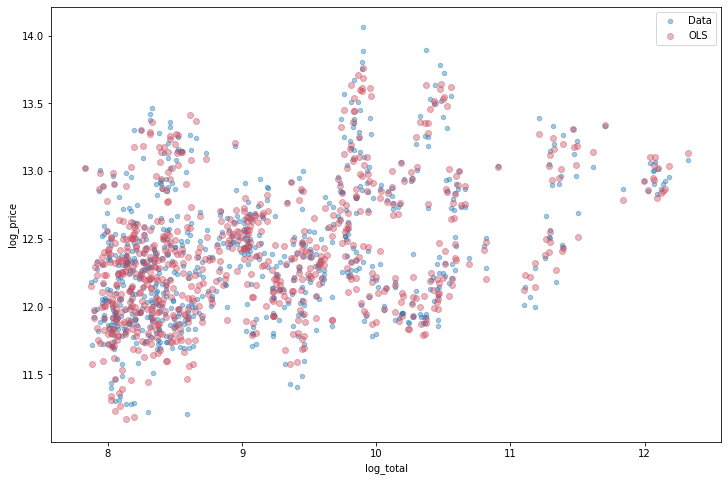

In [16]:
def scatter_plot(df2, X, *models, x='log_total', y='log_price'):
    '''This fuction plots the data and predictions of the models'''
    colors = qeds.themes.COLOR_CYCLE
    
    def scatter(df, x='log_total', y='log_price', ax=None, figsize=(12, 8)):
        if ax is None:
            _, ax = plt.subplots(figsize=figsize)
        df.plot.scatter(x=x , y=y, alpha=0.4, ax=ax)
        return ax

    def scatter_model(model, X, ax=None, x='log_total', y='log_price', figsize=(12, 8), **args):
        if ax is None:
            _, ax = plt.subplots(figsize=figsize)
        ax.scatter(X[x], model.predict(X), alpha=0.4, **args)

    ax = scatter(df2, x=x , y=y)
    for (i,model) in enumerate(models):
        scatter_model(model, X, ax, color=colors[i+1], x=x , y=y)
    ax.legend(["Data", "OLS", "Lasso"])
    
def regress(*countries_of_interest, year_controls=True, region_controls=True):
    countries_of_interest=list(countries_of_interest)
    data = df2.reset_index()
    if 'all' in countries_of_interest:
        countries_of_interest=list(
            data.drop(columns=['log_price','Total','cbsacode','year','RegionName','log_total']))
    
    # Prepare X variable
    X = data.loc[:,countries_of_interest]
    X['Other'] = data['Total'] - data[countries_of_interest].sum(axis=1)
    X['log_total'] = data['log_total']
    if year_controls:
        year_dummies = pd.get_dummies(data['year'], drop_first=True)
        X = X.join(year_dummies)
    if region_controls:
        region_dummies = pd.get_dummies(data['RegionName'], drop_first=True)
        X = X.join(region_dummies)
    X = add_constant(X)
    
    # y variable
    y = data['log_price']
    
    # regressions
    ols = sm.OLS(y, X)
    ols_result = ols.fit()
    lasso_result = ols.fit_regularized(alpha=5e-4,L1_wt=1)
    
    scatter_plot(data, X, ols_result)#, lasso_result)
    return ols_result, lasso_result

#a,b = regress('Mexico',"China, People's Republic", "United Kingdom",'India','France')
a,b= regress("China, People's Republic")
#a,b= regress("all")

By inspection, the model fits the data pretty well. In fact, its R-squared is 0.961:

In [17]:
a.summary().tables[0]

Dep. Variable:,log_price,R-squared:,0.961
Model:,OLS,Adj. R-squared:,0.956
Method:,Least Squares,F-statistic:,211.2
Date:,"Sat, 18 Apr 2020",Prob (F-statistic):,0.00
Time:,16:04:10,Log-Likelihood:,666.53
No. Observations:,728,AIC:,-1179.
Df Residuals:,651,BIC:,-825.6
Df Model:,76,,
Covariance Type:,nonrobust,,


Let's see the coefficients:

In [18]:
a.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
const,9.0173,0.369,24.426,0.000,8.292,9.742
"China, People's Republic",7.675e-06,5.71e-06,1.345,0.179,-3.53e-06,1.89e-05
Other,-4.312e-07,1.3e-06,-0.332,0.740,-2.98e-06,2.12e-06
log_total,0.3029,0.038,7.889,0.000,0.227,0.378
2005-12-31 00:00:00,0.0696,0.022,3.174,0.002,0.027,0.113
2006-12-31 00:00:00,0.1231,0.023,5.341,0.000,0.078,0.168
2007-12-31 00:00:00,0.1751,0.021,8.165,0.000,0.133,0.217
2008-12-31 00:00:00,0.0554,0.022,2.559,0.011,0.013,0.098
2009-12-31 00:00:00,-0.0743,0.022,-3.418,0.001,-0.117,-0.032
2010-12-31 00:00:00,-0.0757,0.021,-3.543,0.000,-0.118,-0.034


Notice the coefficient for China is positive but not significantly different from 0. This means a Chinese immigrant is not significantly different from an average immigrant, in terms of correlation with (log) housing prices. 

Also, the coefficient for log_total is significantly positive, as is in our first regression model. 

Hence, the data suggests that Chinese immigrants does push up housing prices, but not in a way that is different from immigrants from other countries. 

(See Appendix 2 for Lasso regression)

## Bonus: Do low housing prices attract more immigrants?

To investigate this question, I appended to each immigration entry 5 prior years of housing data. I used a linear regression model to explain log total PR admission by prior years housing prices. 

In [19]:
def regress_pr_on_housing(offset:int, year_controls=False, region_controls=True):
    housing_data = log_housing.T
    PR_data = df2.reset_index().loc[:,['RegionName','year','Total','log_total']]
    
    # create offset terms
    year_columns = []
    for i in range(0,offset+1):
        shift = housing_data.shift(i).stack().reset_index().rename(columns={0:f'{i} year prior'})
        PR_data = PR_data.merge(shift, on=['RegionName','year'])
        year_columns.append(f'{i} year prior')
        
    # Prepare X variable
    X = PR_data.loc[:,year_columns]
    if year_controls:
        year_dummies = pd.get_dummies(PR_data['year'], drop_first=True)
        X = X.join(year_dummies)
    if region_controls:
        region_dummies = pd.get_dummies(PR_data['RegionName'], drop_first=True)
        X = X.join(region_dummies)
    X = add_constant(X)
    
    # y variable
    y = PR_data['log_total']
    
    # regressions
    ols = sm.OLS(y, X)
    ols_result = ols.fit()
    return ols_result
a = regress_pr_on_housing(5)

In [20]:
a.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
const,5.3528,0.590,9.065,0.000,4.193,6.512
0 year prior,0.2548,0.089,2.850,0.005,0.079,0.430
1 year prior,0.0799,0.176,0.453,0.651,-0.267,0.426
2 year prior,0.0378,0.208,0.182,0.856,-0.371,0.447
3 year prior,0.0574,0.211,0.272,0.785,-0.356,0.471
4 year prior,0.0244,0.180,0.136,0.892,-0.329,0.378
5 year prior,-0.0719,0.084,-0.855,0.393,-0.237,0.093
"Austin, TX",-1.3677,0.045,-30.160,0.000,-1.457,-1.279
"Bakersfield, CA",-1.9762,0.062,-31.750,0.000,-2.098,-1.854
"Baltimore, MD",-1.1634,0.048,-24.148,0.000,-1.258,-1.069


Note the coefficients of the prior years are all insignificant. Thus, the data does not suggest prior years housing prices to be linearly correlated with immigration. A reason might be that immigration is a lengthy process. If I add in more prior years:

In [21]:
regress_pr_on_housing(10).summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
const,6.5531,0.743,8.818,0.000,5.093,8.013
0 year prior,0.2803,0.090,3.114,0.002,0.104,0.457
1 year prior,0.0170,0.164,0.104,0.917,-0.305,0.339
2 year prior,0.0764,0.185,0.414,0.679,-0.286,0.439
3 year prior,-0.0648,0.194,-0.334,0.739,-0.446,0.317
4 year prior,0.1592,0.199,0.799,0.424,-0.232,0.551
5 year prior,-0.2943,0.196,-1.501,0.134,-0.680,0.091
6 year prior,0.5151,0.198,2.604,0.009,0.127,0.904
7 year prior,-0.5846,0.197,-2.960,0.003,-0.973,-0.197
8 year prior,0.0490,0.200,0.245,0.806,-0.343,0.441


The coefficient of the 6th prior year is significantly positive and that of the 7th prior year is significantly negative! There might be something going on. Maybe it takes 7 years for a person that wants to immigrate to US because of low housing prices to immigrate. 

## Appendix 1: Visualizing Regional Preference for Specific Countries

In [22]:
graph_pr(2018, "Canada")

In [23]:
graph_pr(2018, "Mexico")

In [24]:
graph_pr(2018, "France")

## Appendix 2: Lasso Regression

In this section, I use Lasso regression to see which coefficients are less important. 

Linear R2: 0.9610738048895404
Lasso  R2: 0.9291065830902937


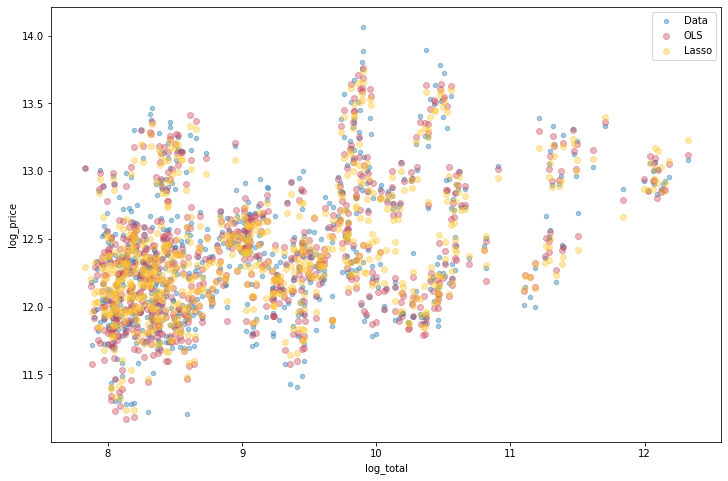

In [25]:
def regress2(*countries_of_interest, year_controls=True, region_controls=True):
    '''This function uses sklearn'''
    countries_of_interest=list(countries_of_interest)
    data = df2.reset_index()
    #countries = data.drop(columns=['log_price', 'Total','cbsacode','year', 'RegionName', 'log_total']).columns
    
    # Prepare X variable
    X = data.loc[:,countries_of_interest]
    X['Other'] = data['Total'] - data[countries_of_interest].sum(axis=1)
    X['log_total'] = data['log_total']
    if year_controls:
        year_dummies = pd.get_dummies(data['year'], drop_first=True)
        X = X.join(year_dummies)
    if region_controls:
        region_dummies = pd.get_dummies(data['RegionName'], drop_first=True)
        X = X.join(region_dummies)
    
    # y variable
    y = data['log_price']
    
    # regressions
    lr_model = linear_model.LinearRegression()
    lr_model.fit(X, y)
    lasso_model = linear_model.Lasso(tol=1e-3, alpha=1e-3)
    lasso_model.fit(X, y)

    lr_coefs   = pd.Series(dict(zip(list(X), lr_model.coef_)))
    lasso_coefs= pd.Series(dict(zip(list(X), lasso_model.coef_)))
    coefs = pd.DataFrame(dict(lasso=lasso_coefs, linreg=lr_coefs))
    
    print('Linear R2:', lr_model.score(X,y))
    print('Lasso  R2:', lasso_model.score(X,y))
    scatter_plot(data, X, lr_model, lasso_model)
    return coefs

coefs = regress2('Mexico',"China, People's Republic", "Korea, South")

The Lasso regression still fits the data pretty well. Let's see which coefficients are suppressed  by Lasso regulation: 

In [26]:
coefs.query('lasso==0')

,lasso,linreg
2014-12-31 00:00:00,-0.0,0.017721
"Bakersfield, CA",0.0,0.692628
"Brownsville, TX",-0.0,-0.006739
"Buffalo, NY",-0.0,0.427049
"Fort Myers, FL",0.0,0.785983
"Jacksonville, FL",-0.0,0.558148
"Las Vegas, NV",0.0,0.445833
"Miami-Fort Lauderdale, FL",0.0,-0.118677
"Nashville, TN",-0.0,0.555896
"New Haven, CT",0.0,0.930427
